# Classificação de Textos com Algoritmos Tradicionais e BoW Features

#Ambiente

In [1]:
%pip install unidecode nltk pandas numpy matplotlib seaborn scikit-learn yellowbrick 

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import re
import nltk
import matplotlib.pyplot as plt
nltk.download("punkt")
nltk.download("punkt_tab")
from unidecode import unidecode
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn import svm, naive_bayes
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, ConfusionMatrixDisplay


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\br31293\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\br31293\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


# Dataset AmericanasBR

https://github.com/americanas-tech/b2w-reviews01/blob/main/b2wreviews01_stil2019.pdf

O dataset original foi simplificado, o campo 'overall_rating' foi usado como 'label':

*   4 e 5 representam positivo (label=1)
*   1 e 2 representam negativo (label=0)
*   rating 3 não foi usado

O dataset resultante originou os dois conjuntos de dados:
*   Treino: usando 5 mil instâncias de cada classe (positivo e negativo).
*   Teste: usando 3 mil instâncias de cada classe excluindo-se instâncias de treino

**Treino e Teste são disjuntos.**



In [3]:
#baixando os dados de treino e teste
!curl https://www.inf.ufrgs.br/~viviane/DS/B2W-Reviews01_binario5000_TRAIN.csv > B2W-Reviews01_binario5000_TRAIN.csv
!curl https://www.inf.ufrgs.br/~viviane/DS/B2W-Reviews01_binario_TEST.csv > B2W-Reviews01_binario_TEST.csv


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 1657k  100 1657k    0     0  5126k      0 --:--:-- --:--:-- --:--:-- 5211k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  981k  100  981k    0     0  5715k      0 --:--:-- --:--:-- --:--:-- 5807k


In [4]:
df_train = pd.read_csv('B2W-Reviews01_binario5000_TRAIN.csv')
df_test = pd.read_csv('B2W-Reviews01_binario_TEST.csv')

# Explorando o dataset

In [5]:
df_train.sample(n=5)

,label,text,label_descr
5390,1,"Maravilhoso, supriu todas as minhas expectativ...",positivo
7542,1,"Me sinto lesado pela empresa Americanas, compr...",positivo
2066,0,"PRODUTO NÃO RECEBIDO E ATÉ HOJE, DEPOIS DE MUI...",negativo
3408,0,Eu comprei esse celular e o prazo de emtrega f...,negativo
8615,1,"O produto é de ótima qualidade, porém a entreg...",positivo


In [6]:
#está balanceado e possui duas classes:
df_train.groupby('label_descr').count()

,label,text
label_descr,,
negativo,5000,5000
positivo,5000,5000


In [7]:
df_test.sample(n=5)

,label,text,label_descr
5788,0,A peça em questão que foi entregue com atraso ...,negativo
1198,1,Chegou no prazo. Gostei muito da torneira. Fu...,positivo
3679,0,AINDA NÃO RECEBI O PRODUTO.???????????????????...,negativo
2438,1,"Produto excelente, super recomendo!!!! Entrega...",positivo
5931,0,"Já fiz reclamação e troca do produto, onde o m...",negativo


In [8]:
#dataset de teste também está balanceado e possui duas classes:
df_test.groupby('label_descr').count()

,label,text
label_descr,,
negativo,3000,3000
positivo,3000,3000


#Pré-processando

In [9]:
#função de pré-processamento
special_chars = "¨'!#$%&()*+,-./:;<=>?@[\]^_`{|}~"
stop_words = stopwords.words('portuguese')

stop_words.remove('não') # mantém o não na lista de stopwords

def preprocess(x):
    new_x = x.replace('"',' ')
    for c in special_chars:
        new_x = new_x.replace(c,' ')
    new_x = ' '.join([word for word in nltk.word_tokenize(new_x.lower(),language='portuguese') if word not in stop_words]) #removendo stop words
    new_x = re.sub(r'[^\w\s]', ' ', new_x) #removendo pontuação do texto
    new_x = re.sub("http\S+", ' ',new_x) # remove links
    new_x = re.sub("@\w+", ' ',new_x) # remove contas com @
    new_x = re.sub('#\S+', ' ',new_x) # hashtags
    new_x = re.sub('[0-9]+', ' ',new_x) # remove numeros e palavras com numeros
    new_x = unidecode(new_x) #acentos
    new_x = re.sub("\s+", ' ',new_x) # espaços
    new_x = new_x.strip()
    return new_x

#pré-processar datasets de treino e teste
df_train['text_original'] = df_train['text']
df_train['text'] = df_train['text'].apply(preprocess)

df_test['text_original'] = df_test['text']
df_test['text'] = df_test['text'].apply(preprocess)

df_train = df_train.sample(n=len(df_train)).copy() # embaralha treino
df_train.reset_index(drop=True, inplace=True)
len(df_train)

<>:2: SyntaxWarning: invalid escape sequence '\]'
<>:13: SyntaxWarning: invalid escape sequence '\S'
<>:14: SyntaxWarning: invalid escape sequence '\w'
<>:15: SyntaxWarning: invalid escape sequence '\S'
<>:18: SyntaxWarning: invalid escape sequence '\s'
<>:2: SyntaxWarning: invalid escape sequence '\]'
<>:13: SyntaxWarning: invalid escape sequence '\S'
<>:14: SyntaxWarning: invalid escape sequence '\w'
<>:15: SyntaxWarning: invalid escape sequence '\S'
<>:18: SyntaxWarning: invalid escape sequence '\s'
C:\Users\br31293\AppData\Local\Temp\ipykernel_2628\2219869268.py:2: SyntaxWarning: invalid escape sequence '\]'
  special_chars = "¨'!#$%&()*+,-./:;<=>?@[\]^_`{|}~"
C:\Users\br31293\AppData\Local\Temp\ipykernel_2628\2219869268.py:13: SyntaxWarning: invalid escape sequence '\S'
  new_x = re.sub("http\S+", ' ',new_x) # remove links
C:\Users\br31293\AppData\Local\Temp\ipykernel_2628\2219869268.py:14: SyntaxWarning: invalid escape sequence '\w'
  new_x = re.sub("@\w+", ' ',new_x) # remove co

10000

In [10]:
# remove instâncias com texto com comprimento zero
df_train = df_train[df_train['text']!='']
df_train = df_train[~df_train['text'].isna()]
df_train.reset_index(drop=True, inplace=True) # reindexa dataframe
len(df_train)

9996

In [11]:
# verifica duplicidades
dup = df_train[df_train.duplicated(subset=['text'])]
print('duplicidades: ',len(dup))

duplicidades:  72


In [12]:
# remove duplicidades
print('antes: ',len(df_train))
df_train = df_train.drop(dup.index)
df_train.reset_index(drop=True, inplace=True) # reindexa dataframe
print('depois: ', len(df_train))

antes:  9996
depois:  9924


#Gerando Representação BoW com pesos TFIDF

Mais informações em https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html

In [13]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer


In [14]:
# calcula features e os valores tfidf gerando os vetores dos documentos:
tfidf_vectorizer = TfidfVectorizer()

vetores_docs  = tfidf_vectorizer.fit_transform(df_train['text'].values)
features   = tfidf_vectorizer.get_feature_names_out()
print(features[1:100])
vetores_docs.shape, features.shape

['aaa' 'aaaaaak' 'aaprelho' 'aaptador' 'abacaxi' 'abafado' 'abaixa'
 'abaixando' 'abaixar' 'abaixo' 'abaixou' 'abajur' 'abalada' 'abalar'
 'abandonei' 'abandonou' 'abc' 'abdomem' 'abelhas' 'abencoe' 'aberta'
 'abertas' 'aberto' 'abertos' 'abertura' 'abhp' 'abi' 'abisurdo' 'abnt'
 'abolir' 'aborrecer' 'aborreceu' 'aborrecida' 'aborrecido'
 'aborrecimento' 'abr' 'abra' 'abraca' 'abracadabra' 'abracadeira'
 'abraco' 'abracos' 'abram' 'abrange' 'abre' 'abrem' 'abreu' 'abreviado'
 'abri' 'abria' 'abrigada' 'abril' 'abrimos' 'abrindo' 'abrir' 'abriram'
 'abrirmos' 'abriu' 'abro' 'abs' 'absolut' 'absolutamente' 'absorcao'
 'absorto' 'absorve' 'absorvendo' 'absorvicao' 'absurda' 'absurdamente'
 'absurdo' 'absurdoooo' 'absurdooooo' 'absurdos' 'abusivo' 'abuso'
 'abusurdo' 'acaba' 'acabada' 'acabadas' 'acabado' 'acabam' 'acabamente'
 'acabamento' 'acabamentos' 'acabamos' 'acabando' 'acabar' 'acabaram'
 'acabe' 'acabei' 'acabem' 'acabo' 'acabou' 'academia' 'academico'
 'academicos' 'acampamento' 

((9924, 13286), (13286,))

In [15]:
# # opções de preprocessamento que sobrescrevem funcoes do tfidftokenizer:

# tfidf_vectorizer = TfidfVectorizer(input='filename', max_features=200,
#                            token_pattern='(?u)\\b[a-zA-Z]\\w{2,}\\b',
#                            max_df=0.05,
#                            stop_words='english',
#                            ngram_range=(1, 3))


# def meu_preprocessamento(doc):
#     # tokeniza com algum toeknizador
#     # adiciona funcoes de preprocessamento
#     return doc
#
# tfidf = TfidfVectorizer(
#     analyzer='word',
#     tokenizer=meu_tokenizador,
#     preprocessor=meu_tokenizador,
#     token_pattern=None)



## Analisando os vetores gerados

In [16]:
doc_id = 0
vetores_docs[doc_id]

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 13 stored elements and shape (1, 13286)>

In [17]:
#features e valores tfidf pertencentes ao 1o documento (indice 0)
print(vetores_docs[doc_id])

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 13 stored elements and shape (1, 13286)>
  Coords	Values
  (0, 5657)	0.24067746405851986
  (0, 3024)	0.34747192923809433
  (0, 2509)	0.24067746405851986
  (0, 8157)	0.2192974556435605
  (0, 9299)	0.291461737206127
  (0, 8348)	0.2358696122168237
  (0, 8644)	0.2400854983321562
  (0, 11856)	0.29058760581273013
  (0, 10470)	0.26084580232372906
  (0, 4891)	0.42575488129285444
  (0, 3111)	0.2116596136286669
  (0, 3479)	0.2505943196311027
  (0, 11448)	0.275225222203962


In [18]:
# outra forma de lidar com esses vetores comprimidos é expandir os mesmos
# verificando o documento (d1)
print('Documento1: ',df_train.at[doc_id,'text'])
d1 = vetores_docs[doc_id].toarray()[0]
print('tamanho do vetor d1:', len(d1))
print(d1)

Documento1:  falta consideracao cliente mes passou momento nenhuma solucao quer entrarao contato dar satisfacao
tamanho do vetor d1: 13286
[0. 0. 0. ... 0. 0. 0.]


In [19]:
# no vetor expandido do documento d1 as features que realmente existem no vetor são:
ids = np.argwhere(d1>0)
ids = np.transpose(ids)[0]
print(ids)

[ 2509  3024  3111  3479  4891  5657  8157  8348  8644  9299 10470 11448
 11856]


In [20]:
d1[678], features[678]

(np.float64(0.0), 'americanas')

In [21]:
print('Documento d1: ',df_train.at[doc_id,'text'])
print('>>> as features que existem em d1 são:')
print(features[ids])
print('>>> tfidf das features de d1 são: ')
print(d1[ids])

Documento d1:  falta consideracao cliente mes passou momento nenhuma solucao quer entrarao contato dar satisfacao
>>> as features que existem em d1 são:
['cliente' 'consideracao' 'contato' 'dar' 'entrarao' 'falta' 'mes'
 'momento' 'nenhuma' 'passou' 'quer' 'satisfacao' 'solucao']
>>> tfidf das features de d1 são: 
[0.24067746 0.34747193 0.21165961 0.25059432 0.42575488 0.24067746
 0.21929746 0.23586961 0.2400855  0.29146174 0.2608458  0.27522522
 0.29058761]


In [22]:
# podemos expandir toda a matriz tfidf:
m = vetores_docs.toarray()
print(f'Matriz tfidf (linhas=docs, colunas=features): {m.shape}')
# visualizando a matriz esparsa tfidf: LINHAS = DOCUMENTOS, COLUNAS = FEATURES = TOKENS
dfM = pd.DataFrame(m)
dfM

Matriz tfidf (linhas=docs, colunas=features): (9924, 13286)


,0,1,2,3,4,5,6,7,8,9,...,13276,13277,13278,13279,13280,13281,13282,13283,13284,13285
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9919,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9920,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9921,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9922,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [23]:
# imprimindo as palavas e seus índices
#for w in dict(enumerate(features)):
 #  print(w, dict(enumerate(features))[w])


In [24]:
# obtendo o token a partir do id (nr da coluna)
id_palavra = 7178 #palavra "inutil" 7178
featuresId=dict(enumerate(features))
featuresId[id_palavra]

'inutil'

In [25]:
# Em quantos documentos (document frequency) esse token está presente e qual o valor do score
print(f"O token <{features[id_palavra]}> aparece em {len(dfM[dfM[id_palavra]>0][id_palavra])} documento(s):")
dfM[dfM[id_palavra]>0][id_palavra]


O token <inutil> aparece em 6 documento(s):


2474    0.218399
2970    0.284066
4650    0.526516
5961    0.239357
8635    0.310409
9921    0.235929
Name: 7178, dtype: float64

In [26]:
#imprimindo instâncias que têm a palavra selecionada
print(df_train.at[959,'text'])
print(df_train.at[7964,'text'])

otima escolha encaixou bem cozinha adoro fazer compras americanas sempre pontual clientes
veio algumas pecas quebradas inclusive bem local onde preciso coloca pes americanas ainda nao deu resposta sobre troca garantia


## Visualizando TFIDF

In [27]:
vetores_docs.shape, tfidf_vectorizer.idf_.shape

((9924, 13286), (13286,))

In [28]:
idf_scores = tfidf_vectorizer.idf_

In [29]:
dfidf = pd.DataFrame({'idf':idf_scores,'words':tfidf_vectorizer.get_feature_names_out()})

<Axes: >

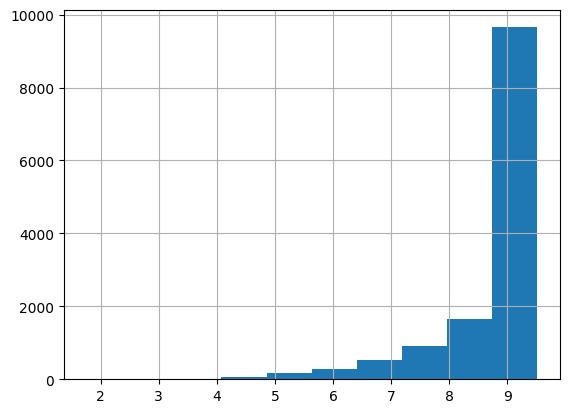

In [30]:
dfidf['idf'].hist()

In [31]:
dfidf.sort_values(by=['idf'],ascending=False, inplace=True)


In [32]:
# importância das palavras no corpus
dfidf

,idf,words
5,9.509665,abacaxi
13277,9.509665,zeus
13278,9.509665,zinco
13280,9.509665,zona
13282,9.509665,zumbi
...,...,...
1746,3.028854,bom
4900,2.832581,entrega
10731,2.787637,recomendo
8566,1.826261,nao


In [33]:
# valores de idf e quantidade de palavras
dfidf.groupby(['idf']).count().sort_values(by=['idf'],ascending=False).head(10)

,words
idf,
9.509665,6922
9.104200,1879
8.816518,851
8.593374,586
8.411053,374
8.256902,262
8.123371,248
8.005588,178
7.900227,160


In [34]:
%%time
#visualizando espacialmente os vetores tfidf reduzidos a duas dimensoes (demora para executar):
from yellowbrick.text import TSNEVisualizer

tfidf = TfidfVectorizer()
X = tfidf.fit_transform(df_train['text'].values)
y = df_train['label'].values

# Create the visualizer and draw the vectors
tsne = TSNEVisualizer(random_state=42) # random_state para reprodutibilidade das projeções em 2D
tsne.fit(X, y)
tsne.show()

ModuleNotFoundError: No module named 'distutils'

# Treinando Modelo de Classificação

In [35]:
df_train.groupby(['label_descr', 'label']).count()

,,text,text_original
label_descr,label,,
negativo,0,4944,4944
positivo,1,4980,4980


In [36]:
# Gerando a representação vetorial para os textos da base de treino
vectorizer = TfidfVectorizer()
#fit_transform ajusta o vetorizador tfidf à base de treino e também transforma o texto em X
X = vectorizer.fit_transform(list(df_train['text']))
y = np.array(df_train['label'])

In [37]:
#efetuar o treinamento usando parâmetros predeterminados
#clf = svm.SVC(C=1.0, kernel='linear', degree=3, gamma='auto')
#efetuar o treinamento usando parâmetros default
clf = svm.SVC()
clf.fit(X, y)

SVC()

In [38]:
# efetuar o treinamento fazendo refit com a melhor configuração:
#model = svm.SVC()
#parameters = {'kernel':['linear','rbf'], 'C':[1, 5]} # neste caso estaremos variando o parâmetro 'C' e 'Kernel' do algoritmo svm
#clf = GridSearchCV(estimator=model, param_grid=parameters, cv=5, verbose=4, scoring=('accuracy','f1_macro'), refit='accuracy')
#clf.fit(X, y)
#print(f"Para {model} melhor score {clf.best_score_:.3f} para os seguintes parâmetros: {clf.best_params_}")

##Prevendo a classe das instâncias de teste

In [39]:
# Gerando a representação vetorial para os textos da base de teste
X_true = vectorizer.transform(df_test['text'].values) #somente transform usando vocabulario do treino
y_true = df_test['label'].values
# gera as predições para os dados de teste:
y_pred = clf.predict(X_true)

In [40]:
y_pred[0:15]

array([1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1])

##Avaliando a Qualidade do Modelo

Acurácia: 0.934
F1-macro: 0.934


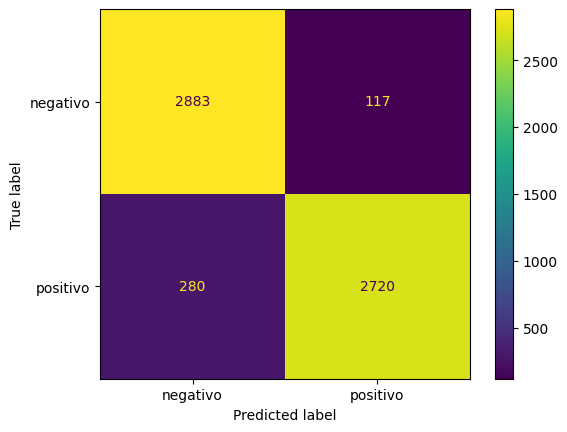

In [41]:
print(f"Acurácia: {accuracy_score(y_true, y_pred):.3f}")
print(f"F1-macro: {f1_score(y_true, y_pred, average='macro'):.3f}")
cm = confusion_matrix(y_true, y_pred)
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = list(df_train.label_descr.unique()))
cm_display.plot()
plt.show()

##Examinando os as instâncias mal classificadas

In [42]:
erros  = list (zip(df_test['text'].values,df_test['text_original'].values,y_true,y_pred)) #criando lista com os erros
erros = [item for item in erros if item[2] != item[3]] #removendo as instâncias corretas
df_erros = pd.DataFrame(erros,columns =['Texto','Original','True','Pred']) #gerando um dataframe para ficar mais fácil de trabalhar

In [43]:
#acrescentando colunas FP e FN no dataframe com os erros
df_erros['FP'] = df_erros.apply(lambda x: 1 if ((x['Pred']==1) & (x['True']==0)) else 0, axis=1)
df_erros['FN'] = df_erros.apply(lambda x: 1 if ((x['Pred']==0) & (x['True']==1)) else 0, axis=1)

In [44]:
print('Há ', len(df_erros),' instâncias mal classificadas.')

Há  397  instâncias mal classificadas.


In [45]:
df_erros[df_erros['FN']==1]

,Texto,Original,True,Pred,FP,FN
0,chegou antes prazo caneta fininha nao falha es...,"Chegou antes do prazo, a caneta é fininha e na...",1,0,0,1
1,comprei entrega jato entregar dia util comprei...,Comprei entrega a jato para entregar em 1 dia ...,1,0,0,1
2,funciona faz pipoca rapida saudavel nao desper...,"Funciona mesmo. Faz pipoca rápida, saudável e ...",1,0,0,1
3,melhor tons po mandam avaliar criam dificuldad...,"melhor que 50 tons , pô vocês mandam avaliar m...",1,0,0,1
4,agradei aparelho vi alguns tutoriais internet ...,Agradei do aparelho. Vi alguns tutoriais na in...,1,0,0,1
...,...,...,...,...,...,...
275,bem legal celular tela grande bateria dura des...,"Bem legal o celular, tela grande, bateria du...",1,0,0,1
276,bicicleta boa porem nao pega cambio traseiro r...,A bicicleta é muito boa porém não pega câmbio ...,1,0,0,1
277,melhor pc ever compreee oque ta esperando vai ...,melhor pc ever compreee.Oque se ta esperando v...,1,0,0,1
278,apesar nvi nao traducao preferida biblia cumpr...,Apesar da NVI não ser a minha tradução preferi...,1,0,0,1


In [46]:
df_erros[df_erros['FP']==1]

,Texto,Original,True,Pred,FP,FN
280,comprei interesse principalmente proteger cama...,Eu comprei no interesse de principalmente de p...,0,1,1,0
281,comprei final novembro volta dia recebi dei na...,Comprei no final de novembro por volta do dia ...,0,1,1,0
282,excelente produto otimo preco comprei colocar ...,"Um excelente produto, ótimo preço, comprei par...",0,1,1,0
283,celular otimo desempenho cumpre promete compre...,O celular tem um ótimo desempenho. Cumpre o q...,0,1,1,0
284,material excelente qualidade boca defeito acen...,"Material é de excelente qualidade, mas uma boc...",0,1,1,0
...,...,...,...,...,...,...
392,produto eh lindo problema entrega muita demora...,O produto eh lindo. O problema foi a entrega. ...,0,1,1,0
393,gostei camera designer otimo nao trava nao gos...,"Gostei câmera, designer e ótimo ,não trava o q...",0,1,1,0
394,prnsei vidro qualidade bem ruim quer algo simp...,Prnsei que fosse de vidro e qualidade bem ruim...,0,1,1,0
395,nao aprovei produto questoes qualidade cor ach...,Não aprovei o produto pelas questões da qualid...,0,1,1,0


In [48]:
#salvando csv com as instâncias mal classificadas
path = 'erros_americanas.csv'
df_erros.to_csv(path)

#O problema das palavras fora do vocabulário OOV

In [ ]:
#retorna o vocabulário do dataset
def vocabulario (texto):
  tokens_nltk = []
  for t in texto.values:
    tokens_nltk.extend(nltk.word_tokenize(t, language='portuguese'))
  tokens_distintos = set(tokens_nltk)
  return tokens_distintos

vocab_train = vocabulario(df_train['text'])
vocab_test = vocabulario(df_test['text'])


In [ ]:
#tamanho do vocabulário de treino e teste
print (len(vocab_train))
print (len(vocab_test))

In [ ]:
oov = vocab_test.difference(vocab_train) #oov tem as palavras que aparecem no teste mas não no treino

In [ ]:
print('Número de palavras que estão no teste e não no treino (OOV):',len(oov))

In [ ]:
oov = list(oov) #transformando o conjunto em lista
oov.sort() #ordenando a lista

In [ ]:
#imprimindo as oovs
oov[400:600]